In [64]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV

In [5]:
df = pd.read_csv("weatherdata_cleaned.csv")
df

,Date,Year,Month,Month_Name,Min Temperature(°C),Max Temperature(°C),Average Temperature(°C),Precipitation(mm),Wind(km/h),Relative Humidity,Solar(W/m²)
0,1979-01-01,1979,1,January,25.154,28.419,26.786,13.125,6.932,0.824,21.584
1,1979-01-02,1979,1,January,24.853,27.973,26.413,23.355,6.081,0.870,19.647
2,1979-01-03,1979,1,January,25.469,27.772,26.620,39.468,6.015,0.874,23.400
3,1979-01-04,1979,1,January,24.851,26.534,25.692,23.830,6.422,0.886,13.279
4,1979-01-05,1979,1,January,24.974,28.343,26.658,9.089,6.162,0.844,24.058
...,...,...,...,...,...,...,...,...,...,...,...
12863,2014-07-27,2014,7,July,24.404,25.289,24.846,1.454,9.012,0.783,9.886
12864,2014-07-28,2014,7,July,24.241,25.330,24.786,0.175,7.152,0.769,12.207
12865,2014-07-29,2014,7,July,24.001,24.962,24.482,0.199,7.633,0.774,12.285
12866,2014-07-30,2014,7,July,23.743,25.913,24.828,0.261,7.940,0.752,15.678


Fitting 3 folds for each of 50 candidates, totalling 150 fits

Target: Average Temperature(°C)
Best Parameters: {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 30, 'bootstrap': True}
Train MAE: 0.2816, RMSE: 0.3976, R²: 0.9475
Test MAE: 0.4602, RMSE: 0.6052, R²: 0.8505


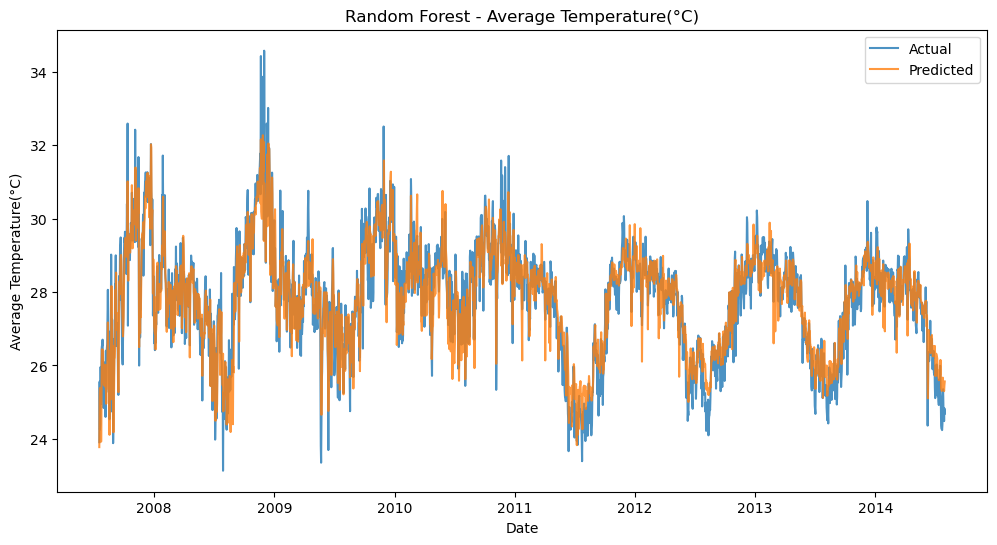

Saved predictions to predictions_average_temperature(c).csv
Fitting 3 folds for each of 50 candidates, totalling 150 fits

Target: Min Temperature(°C)
Best Parameters: {'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 30, 'bootstrap': True}
Train MAE: 0.2645, RMSE: 0.3822, R²: 0.9430
Test MAE: 0.4962, RMSE: 0.6449, R²: 0.8409


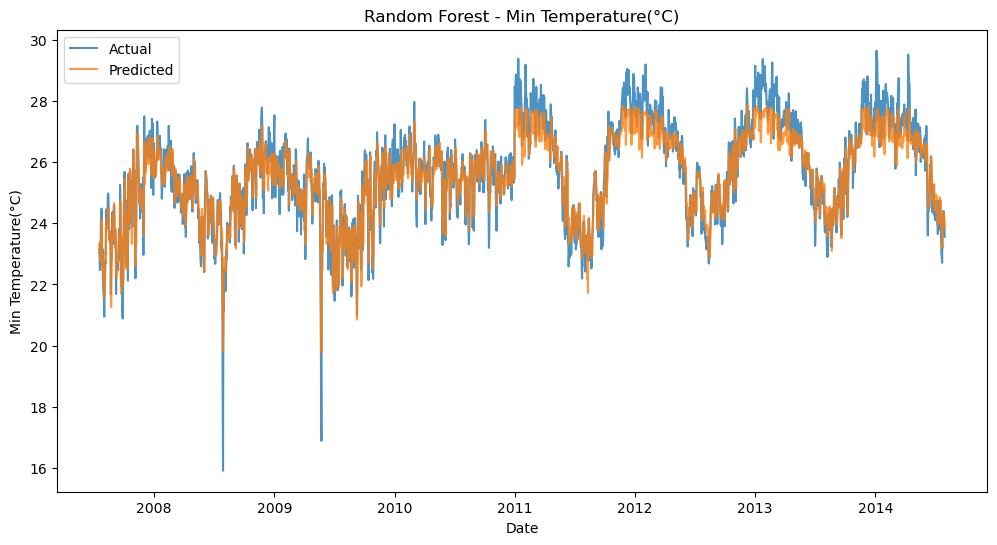

Saved predictions to predictions_min_temperature(c).csv
Fitting 3 folds for each of 50 candidates, totalling 150 fits

Target: Max Temperature(°C)
Best Parameters: {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 30, 'bootstrap': True}
Train MAE: 0.4198, RMSE: 0.6092, R²: 0.9562
Test MAE: 1.0355, RMSE: 1.3417, R²: 0.7309


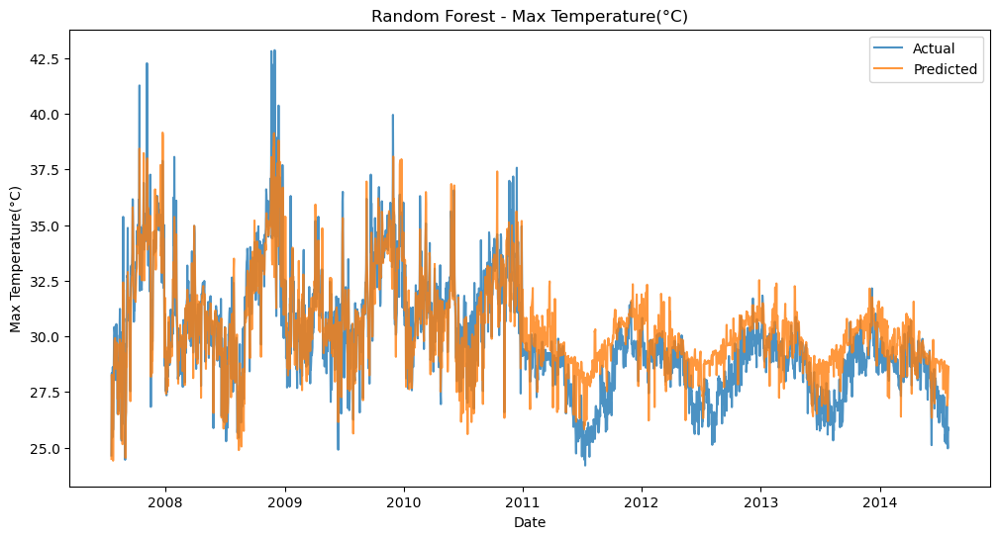

Saved predictions to predictions_max_temperature(c).csv


In [24]:
# Warning:
# This code takes long to run and running it comes with the probability 
# that your laptop might turn into a rocket ship.

def train_target(data, target_column, drop_cols = None, rf_param_dist = None, 
                 n_iter = 50, cv = 3, lags = list(range(1,22)), save_csv = True):
    
    
    data = data.copy()
    
    if drop_cols is None:
        drop_cols = []
    
    if rf_param_dist is None:
        rf_param_dist = {
            "n_estimators": [200, 300],
            "max_depth": [10, 20, 30, 40],
            "min_samples_split": [5, 10, 15],
            "min_samples_leaf": [4, 10],
            "max_features": [None, "sqrt", "log2"],
            "bootstrap": [True, False]
        }
        
    original_dates = pd.to_datetime(data["Date"])
    
    for lag in lags:
        data[f"{target_column}_lag_{lag}"] = data[target_column].shift(lag)
    
    data = data.dropna().reset_index(drop = True)
    
    columns_to_drop = [target_column] + drop_cols
    X = data.drop(columns=columns_to_drop)
    y = data[target_column]
    X = X.select_dtypes(include=[np.number])
    
    train_size = int(len(data) * 0.8)
    X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
    y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]
    
    dates_test = original_dates.iloc[-len(y_test):]
    
    rf = RandomForestRegressor(random_state = 42)
    tscv = TimeSeriesSplit(n_splits = cv)
    randomized_search = RandomizedSearchCV(
        estimator = rf,
        param_distributions = rf_param_dist,
        n_iter = n_iter,
        cv = tscv,
        scoring = 'neg_mean_absolute_error',
        n_jobs = -1,
        verbose = 1,
        random_state = 42
    )
    
    randomized_search.fit(X_train, y_train)
    best_rf = randomized_search.best_estimator_
    
    y_test_pred = best_rf.predict(X_test)
    y_train_pred = best_rf.predict(X_train)
    
    mae_train = mean_absolute_error(y_train, y_train_pred)
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    r2_train = r2_score(y_train, y_train_pred)
    
    mae_test = mean_absolute_error(y_test, y_test_pred)
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    r2_test = r2_score(y_test, y_test_pred)
    
    print(f"\nTarget: {target_column}")
    print("Best Parameters:", randomized_search.best_params_)
    print(f"Train MAE: {mae_train:.4f}, RMSE: {rmse_train:.4f}, R²: {r2_train:.4f}")
    print(f"Test MAE: {mae_test:.4f}, RMSE: {rmse_test:.4f}, R²: {r2_test:.4f}")

    plt.figure(figsize=(12,6))
    plt.plot(dates_test, y_test.values, label="Actual", alpha=0.8)
    plt.plot(dates_test, y_test_pred, label="Predicted", alpha=0.8)
    plt.title(f"Random Forest - {target_column}")
    plt.xlabel("Date")
    plt.ylabel(target_column)
    plt.legend()
    plt.show()
    
    result_df = pd.DataFrame({
        "Date": dates_test,
        "Actual": y_test.values,
        "Predicted": y_test_pred
    })
    
    if save_csv:
        filename = f"predictions_{target_column.replace(' ', '_').replace('°C','C').lower()}.csv"
        result_df.to_csv(filename, index=False)
        print(f"Saved predictions to {filename}")

    return result_df

target_column_1 = "Average Temperature(°C)"
drop_cols_1 = ["Date", "Min Temperature(°C)", "Max Temperature(°C)", "Month_Name"]
pred_avg_temp = train_target(df, target_column_1, drop_cols_1)

target_column_2 = "Min Temperature(°C)"
drop_cols_2 = ["Date", "Average Temperature(°C)", "Max Temperature(°C)", "Month_Name"]
pred_min_temp = train_target(df, target_column_2, drop_cols_2)

target_column_3 = "Max Temperature(°C)"
drop_cols_3 = ["Date", "Min Temperature(°C)", "Average Temperature(°C)", "Month_Name"]
pred_max_temp = train_target(df, target_column_3, drop_cols_3)

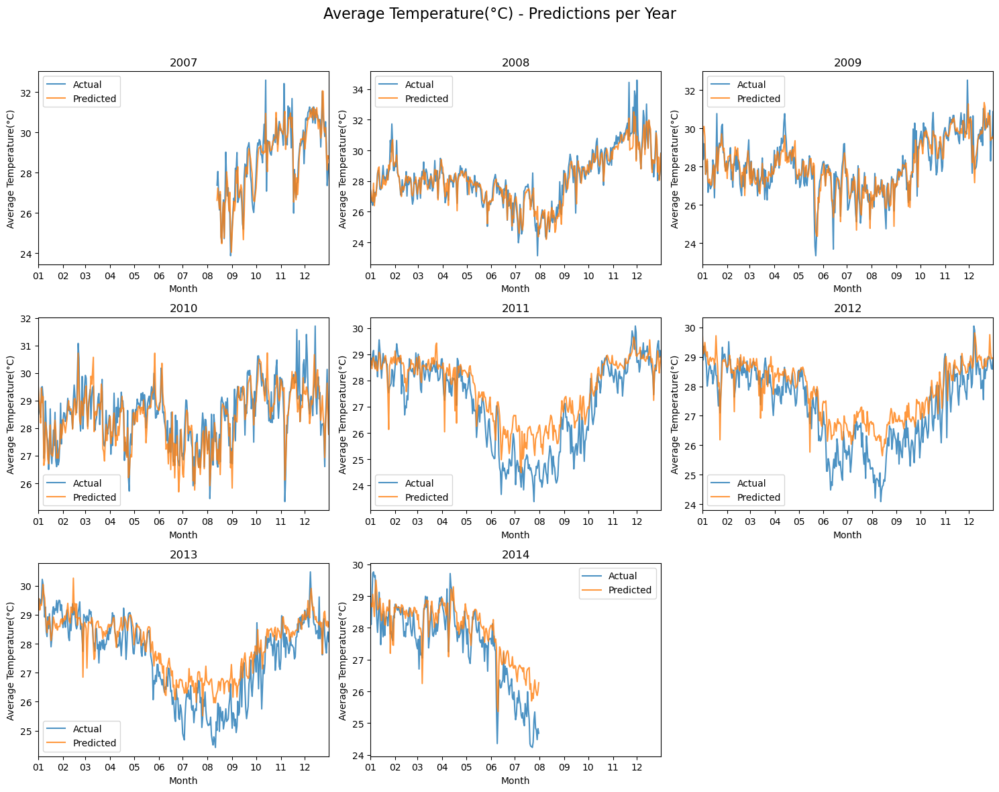

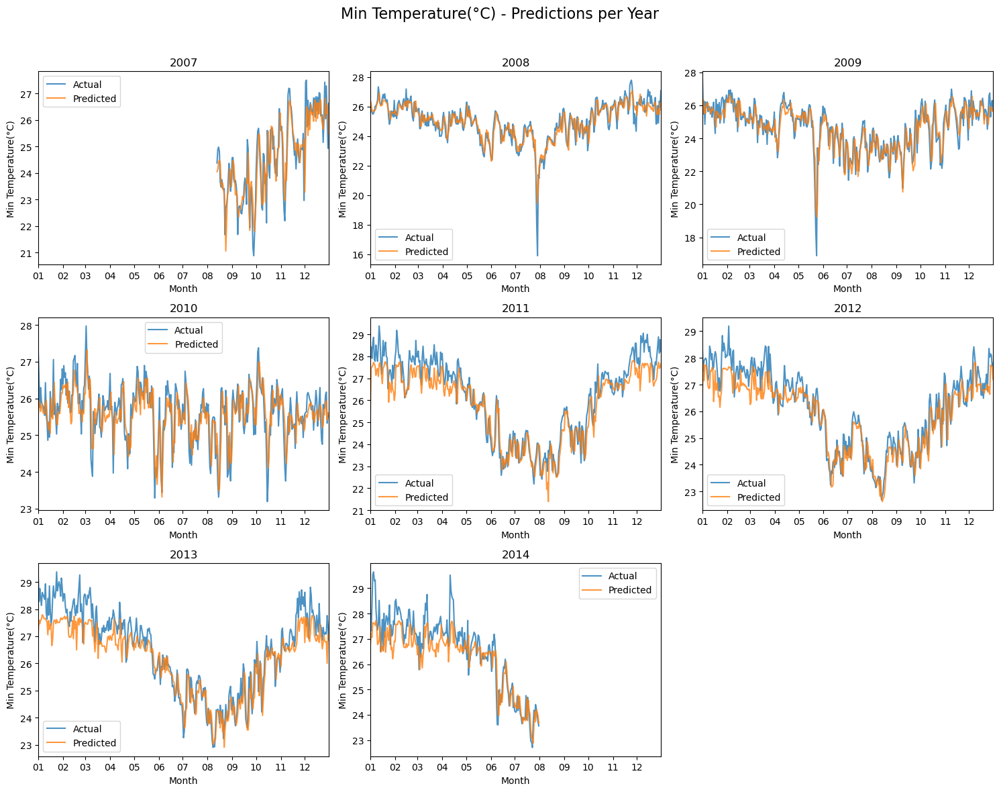

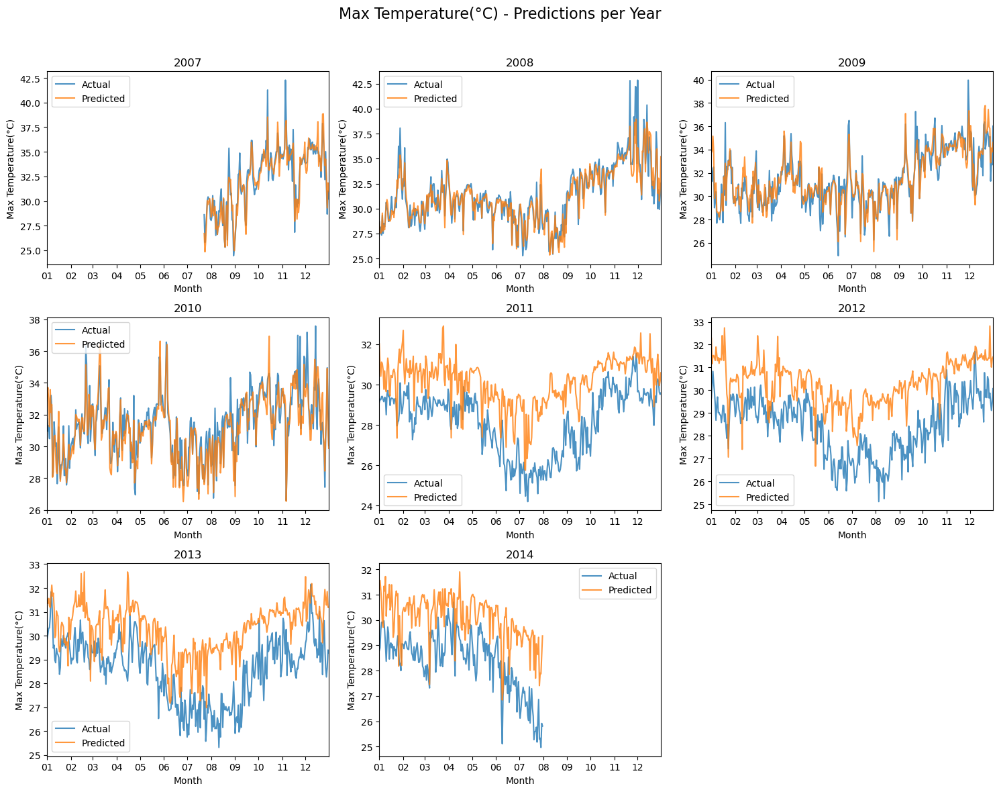

In [45]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import math
import pandas as pd

def plot_predictions_wrap(df_pred, target_name, n_cols=3):
    df_pred = df_pred.copy()
    df_pred["Date"] = pd.to_datetime(df_pred["Date"])
    df_pred["Year"] = df_pred["Date"].dt.year

    years = sorted(df_pred["Year"].unique())
    n_years = len(years)
    n_rows = math.ceil(n_years / n_cols)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows), sharey=False)
    axes = axes.flatten()
    
    for i, year in enumerate(years):
        df_year = df_pred[df_pred["Year"] == year]
        axes[i].plot(df_year["Date"], df_year["Actual"], label="Actual", alpha=0.8)
        axes[i].plot(df_year["Date"], df_year["Predicted"], label="Predicted", alpha=0.8)
        axes[i].set_title(f"{year}")
        axes[i].set_ylabel(target_name)
        axes[i].legend()
        
        start_date = pd.Timestamp(year=year, month=1, day=1)
        end_date = pd.Timestamp(year=year, month=12, day=31)
        axes[i].set_xlim(start_date, end_date)
        
        months = pd.date_range(start=start_date, end=end_date, freq='MS')
        axes[i].set_xticks(months)
        
        axes[i].xaxis.set_major_formatter(mdates.DateFormatter('%m'))
        axes[i].set_xlabel("Month")
    
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])
    
    fig.suptitle(f"{target_name} - Predictions per Year", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

plot_predictions_wrap(pred_avg_temp, "Average Temperature(°C)")
plot_predictions_wrap(pred_min_temp, "Min Temperature(°C)")
plot_predictions_wrap(pred_max_temp, "Max Temperature(°C)")

In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

df = df.copy()

df["Date"] = pd.to_datetime(df["Date"])

target_columns = ["Average Temperature(°C)", "Min Temperature(°C)", "Max Temperature(°C)"]

lags = list(range(1, 22))

for target in target_columns:
    for lag in lags:
        df[f"{target}_lag_{lag}"] = df[target].shift(lag)

df = df.dropna().reset_index(drop=True)

train_size = int(len(df) * 0.8)
dates_test = df["Date"].iloc[train_size:]

def train_target(df, target_column, drop_cols=None, save_csv=True, plot=True):
    
    if drop_cols is None:
        drop_cols = []
    
    """if rf_param_dist is None:
        rf_param_dist = {
            "n_estimators": [200, 300],
            "max_depth": [10, 20, 30, 40],
            "min_samples_split": [5, 10, 15],
            "min_samples_leaf": [4, 10],
            "max_features": [None, "sqrt", "log2"],
            "bootstrap": [True, False]
        }"""
    
    columns_to_drop = [target_column] + drop_cols
    X = df.drop(columns=columns_to_drop)
    y = df[target_column]
    
    X = X.select_dtypes(include=[np.number])
    
    X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
    y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]
    
    '''rf = RandomForestRegressor(random_state = 42)
    tscv = TimeSeriesSplit(n_splits=cv)
    randomized_search = RandomizedSearchCV(
        estimator=rf,
        param_distributions=rf_param_dist,
        n_iter=n_iter,
        cv=tscv,
        scoring='neg_mean_absolute_error',
        n_jobs=-1,
        verbose=1,
        random_state=42
    )
    
    randomized_search.fit(X_train, y_train)
    best_rf = randomized_search.best_estimator_'''
    
    best_rf = RandomForestRegressor(
        n_estimators=300,
        max_depth=30,
        min_samples_split=10,
        min_samples_leaf=50,
        max_features=None,
        bootstrap=True,
        random_state=42
    )
    
    best_rf.fit(X_train, y_train)
    
    
    importances = pd.Series(best_rf.feature_importances_, index=X.columns)

    y_train_pred = best_rf.predict(X_train)
    y_test_pred = best_rf.predict(X_test)
    
    mae_train = mean_absolute_error(y_train, y_train_pred)
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    r2_train = r2_score(y_train, y_train_pred)
    
    mae_test = mean_absolute_error(y_test, y_test_pred)
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    r2_test = r2_score(y_test, y_test_pred)
    
    print(f"\nTarget: {target_column}")
    print(f"Train MAE: {mae_train:.4f}, RMSE: {rmse_train:.4f}, R²: {r2_train:.4f}")
    print(f"Test MAE: {mae_test:.4f}, RMSE: {rmse_test:.4f}, R²: {r2_test:.4f}")
    
    if plot:
        plt.figure(figsize=(12,6))
        plt.plot(dates_test, y_test.values, label="Actual", alpha=0.8)
        plt.plot(dates_test, y_test_pred, label="Predicted", alpha=0.8)
        plt.title(f"Random Forest - {target_column}")
        plt.xlabel("Date")
        plt.ylabel(target_column)
        plt.legend()
        plt.show()
    
    if r2_train - r2_test > 0.2:
        print("⚠️ Possible overfitting: Train R² much higher than Test R²")

    print("Top 10 important features:\n", importances.sort_values(ascending=False).head(10))

    plt.figure(figsize=(10,5))
    plt.scatter(y_test_pred, y_test_pred - y_test.values, alpha=0.5)
    plt.axhline(0, color='red', linestyle='--')
    plt.xlabel("Predicted")
    plt.ylabel("Residuals")
    plt.title(f"Residuals - {target_column}")
    plt.show()

    result_df = pd.DataFrame({
        "Date": dates_test,
        "Actual": y_test.values,
        "Predicted": y_test_pred
    })
    
    if save_csv:
        filename = f"predictions_{target_column.replace(' ', '_').replace('°C','C').lower()}.csv"
        result_df.to_csv(filename, index=False)
        print(f"Saved predictions to {filename}")
    
    return result_df


Target: Average Temperature(°C)
Train MAE: 0.4884, RMSE: 0.6599, R²: 0.8567
Test MAE: 0.5462, RMSE: 0.7268, R²: 0.7815


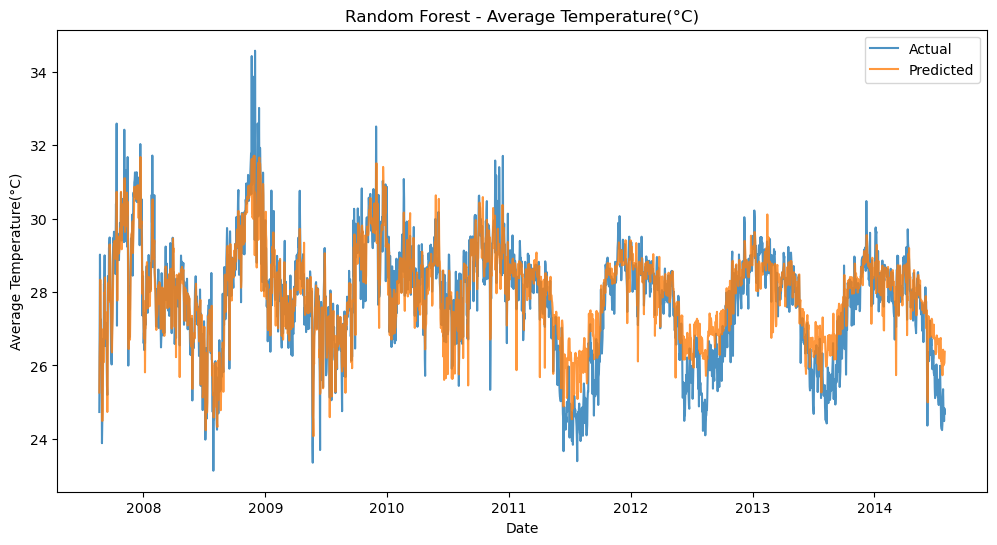

Top 10 important features:
 Average Temperature(°C)_lag_1    0.800630
Solar(W/m²)                      0.065514
Relative Humidity                0.052185
Min Temperature(°C)_lag_1        0.025280
Wind(km/h)                       0.020507
Average Temperature(°C)_lag_3    0.004208
Average Temperature(°C)_lag_2    0.003046
Average Temperature(°C)_lag_5    0.002278
Average Temperature(°C)_lag_6    0.001566
Average Temperature(°C)_lag_4    0.001513
dtype: float64


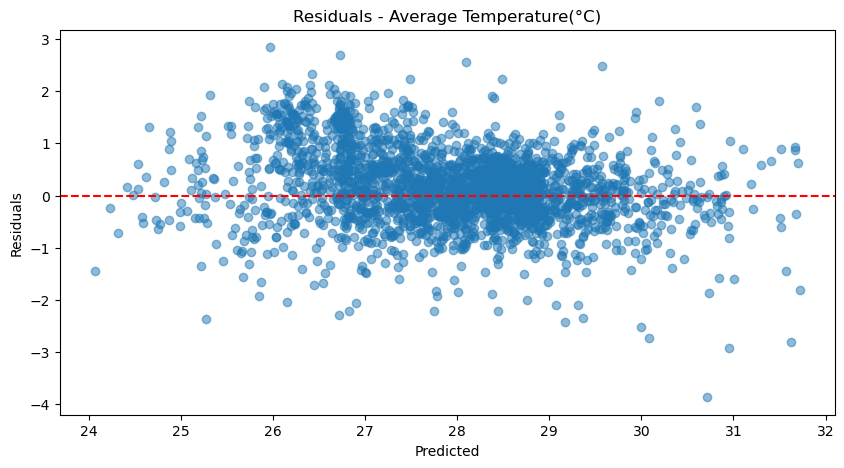

Saved predictions to predictions_average_temperature(c).csv


In [52]:
drop_cols_avg = ["Date", "Min Temperature(°C)", "Max Temperature(°C)", "Month_Name"]
pred_avg_temp = train_target(df, "Average Temperature(°C)", drop_cols_avg)


Target: Min Temperature(°C)
Train MAE: 0.4830, RMSE: 0.6638, R²: 0.8296
Test MAE: 0.5562, RMSE: 0.7337, R²: 0.7894


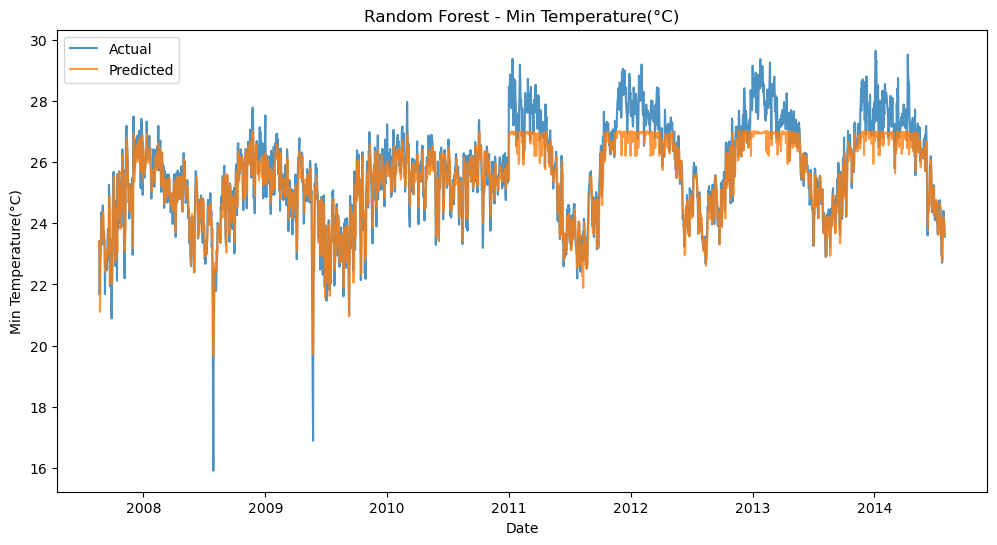

Top 10 important features:
 Min Temperature(°C)_lag_1         0.910030
Wind(km/h)                        0.028028
Precipitation(mm)                 0.007725
Average Temperature(°C)_lag_1     0.005524
Relative Humidity                 0.003012
Max Temperature(°C)_lag_2         0.002608
Average Temperature(°C)_lag_14    0.002087
Month                             0.001788
Average Temperature(°C)_lag_3     0.001604
Average Temperature(°C)_lag_21    0.001471
dtype: float64


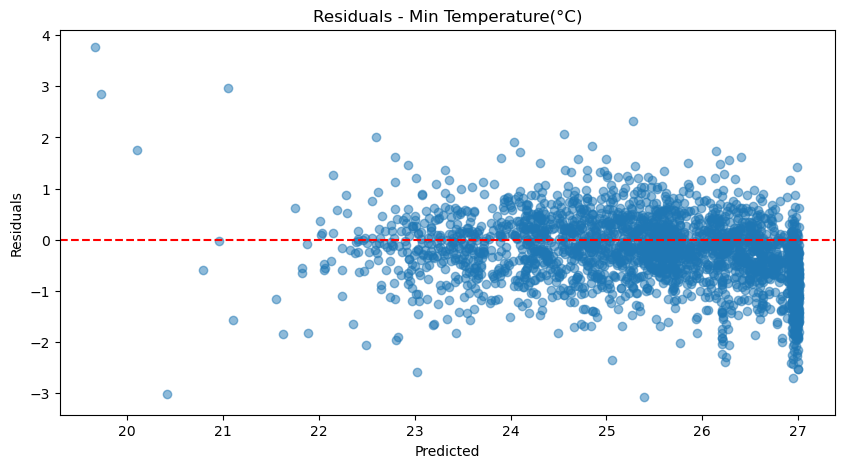

Saved predictions to predictions_min_temperature(c).csv


In [54]:
drop_cols_min = ["Date", "Average Temperature(°C)", "Max Temperature(°C)", "Month_Name"]
pred_min_temp = train_target(df, "Min Temperature(°C)", drop_cols_min)


Target: Max Temperature(°C)
Train MAE: 0.7381, RMSE: 1.0394, R²: 0.8734
Test MAE: 1.3280, RMSE: 1.6589, R²: 0.5896


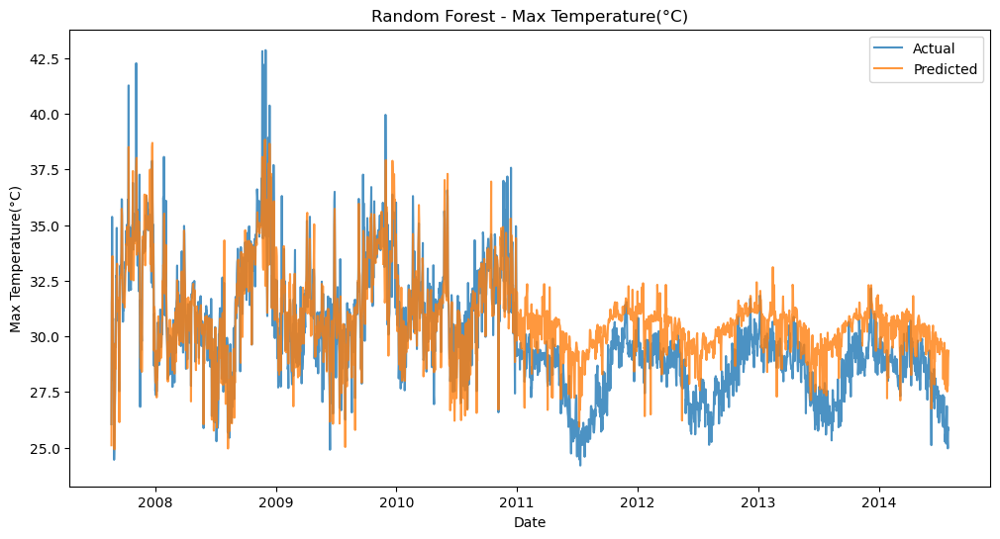

⚠️ Possible overfitting: Train R² much higher than Test R²
Top 10 important features:
 Max Temperature(°C)_lag_1        0.619751
Solar(W/m²)                      0.163312
Relative Humidity                0.097002
Wind(km/h)                       0.082962
Average Temperature(°C)_lag_1    0.012665
Min Temperature(°C)_lag_1        0.004662
Month                            0.003636
Average Temperature(°C)_lag_2    0.001442
Max Temperature(°C)_lag_7        0.000909
Max Temperature(°C)_lag_5        0.000844
dtype: float64


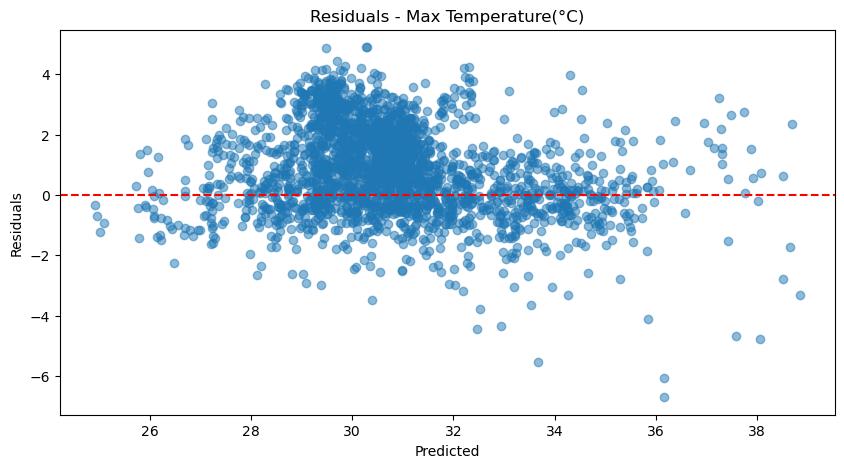

Saved predictions to predictions_max_temperature(c).csv


In [53]:
drop_cols_max = ["Date", "Min Temperature(°C)", "Average Temperature(°C)", "Month_Name"]
pred_max_temp = train_target(df, "Max Temperature(°C)", drop_cols_max)

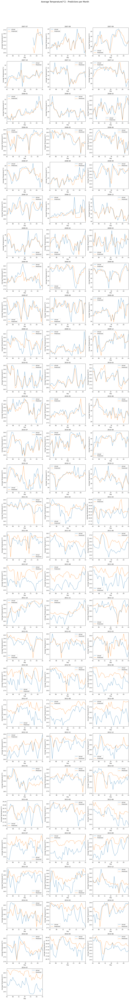

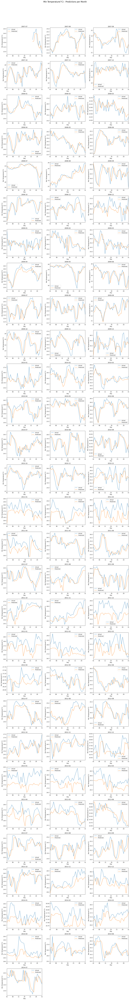

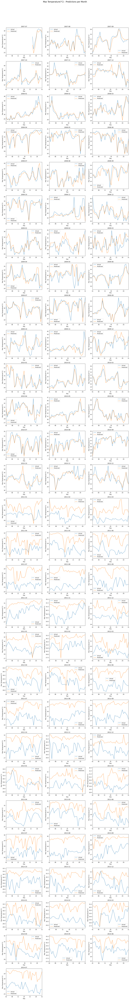

In [35]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import math
import pandas as pd

def plot_predictions_monthly(df_pred, target_name, n_cols=3):
    df_pred = df_pred.copy()
    df_pred["Date"] = pd.to_datetime(df_pred["Date"])
    df_pred["Year"] = df_pred["Date"].dt.year
    df_pred["Month"] = df_pred["Date"].dt.month

    months = sorted(df_pred[["Year", "Month"]].drop_duplicates().apply(tuple, axis=1))
    n_months = len(months)
    n_rows = math.ceil(n_months / n_cols)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows), sharey=False)
    axes = axes.flatten()
    
    for i, (year, month) in enumerate(months):
        df_month = df_pred[(df_pred["Year"] == year) & (df_pred["Month"] == month)]
        axes[i].plot(df_month["Date"], df_month["Actual"], label="Actual", alpha=0.8)
        axes[i].plot(df_month["Date"], df_month["Predicted"], label="Predicted", alpha=0.8)
        axes[i].set_title(f"{year}-{month:02d}")
        axes[i].set_ylabel(target_name)
        axes[i].legend()
        
        start_date = pd.Timestamp(year=year, month=month, day=1)
        end_date = pd.Timestamp(year=year, month=month, day=pd.Period(f"{year}-{month:02d}").days_in_month)
        axes[i].set_xlim(start_date, end_date)
        
        days = pd.date_range(start=start_date, end=end_date, freq='5D')
        axes[i].set_xticks(days)
        
        axes[i].xaxis.set_major_formatter(mdates.DateFormatter('%d'))
        axes[i].set_xlabel("Day")
    
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])
    
    fig.suptitle(f"{target_name} - Predictions per Month", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

plot_predictions_monthly(pred_avg_temp, "Average Temperature(°C)")
plot_predictions_monthly(pred_min_temp, "Min Temperature(°C)")
plot_predictions_monthly(pred_max_temp, "Max Temperature(°C)")

In [61]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.backends.backend_pdf import PdfPages
import math

df_combined = pd.DataFrame()
df_combined['Date'] = pred_avg_temp['Date']
df_combined['Actual_Min'] = pred_min_temp['Actual']
df_combined['Actual_Max'] = pred_max_temp['Actual']
df_combined['Actual_Avg'] = pred_avg_temp['Actual']
df_combined['Predicted_Min'] = pred_min_temp['Predicted']
df_combined['Predicted_Max'] = pred_max_temp['Predicted']
df_combined['Predicted_Avg'] = pred_avg_temp['Predicted']

def save_monthly_plots_to_pdf(df, filename="temperature_plots.pdf"):
    df = df.copy()
    df['Date'] = pd.to_datetime(df['Date'])
    df['Year'] = df['Date'].dt.year
    df['Month'] = df['Date'].dt.month

    years = sorted(df['Year'].unique())

    with PdfPages(filename) as pdf:
        for year in years:
            df_year = df[df['Year'] == year]
            months = sorted(df_year['Month'].unique())
            n_months = len(months)
            n_cols = 3
            n_rows = math.ceil(n_months / n_cols)

            fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows), sharey=False)
            axes = axes.flatten()

            for i, month in enumerate(months):
                df_month = df_year[df_year['Month'] == month]

                axes[i].plot(df_month['Date'], df_month['Actual_Min'], label='Actual Min', color='#a6cee3', alpha=0.8)
                axes[i].plot(df_month['Date'], df_month['Actual_Avg'], label='Actual Avg', color='#1f78b4', alpha=0.8)
                axes[i].plot(df_month['Date'], df_month['Actual_Max'], label='Actual Max', color='#08306b', alpha=0.8)

                axes[i].plot(df_month['Date'], df_month['Predicted_Min'], label='Predicted Min', color='#fb9a99', alpha=0.8, linestyle='--')
                axes[i].plot(df_month['Date'], df_month['Predicted_Avg'], label='Predicted Avg', color='#e31a1c', alpha=0.8, linestyle='--')
                axes[i].plot(df_month['Date'], df_month['Predicted_Max'], label='Predicted Max', color='#67000d', alpha=0.8, linestyle='--')

                axes[i].set_title(f"{year}-{month:02d}")
                axes[i].set_ylabel("Temperature (°C)")
                axes[i].legend()

                start_date = pd.Timestamp(year=year, month=month, day=1)
                end_date = pd.Timestamp(year=year, month=month, day=pd.Period(f"{year}-{month:02d}").days_in_month)
                axes[i].set_xlim(start_date, end_date)
                days = pd.date_range(start=start_date, end=end_date, freq='5D')
                axes[i].set_xticks(days)
                axes[i].xaxis.set_major_formatter(mdates.DateFormatter('%d'))
                axes[i].set_xlabel("Day")

            for j in range(i+1, len(axes)):
                fig.delaxes(axes[j])

            fig.suptitle(f"{year} - Monthly Actual vs Predicted Temperatures", fontsize=16)
            plt.tight_layout(rect=[0, 0, 1, 0.96])
            
            pdf.savefig(fig)
            plt.close(fig)

    print(f"Plots saved to {filename}")

save_monthly_plots_to_pdf(df_combined, filename="temperature_predictions.pdf")

Plots saved to temperature_predictions.pdf
